In [14]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans, DBSCAN
sns.set()
%matplotlib inline

In [15]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn import preprocessing

In [16]:
import pwlf

In [17]:
import piecewise_regression

In [18]:
plt.rcParams['figure.figsize'] = [16, 9]

In [19]:
w = pd.read_csv(r'The revised 292 F - 2018-12-31.csv',parse_dates=['Timestamp'], index_col='Timestamp')

In [20]:
w = (w - 32)/1.8
w = w.round(2)

In [21]:
e = pd.read_csv(r'afterQ295(Dec2).csv',parse_dates=['Timestamp'], index_col='Timestamp')

In [23]:
building_list = pd.read_excel('Revised startup and shutdown time all categories.xlsx', sheet_name='Office')
building_4A = building_list[building_list['Climate Zone'] == '4A']
buildings = building_4A['Building ID']

In [24]:
buildings = np.unique(buildings)

In [25]:
len(buildings)

37

In [26]:
buildings = buildings[buildings != 'MD0325ZZ']

In [27]:
building_info = pd.read_excel('extracted data of 295 buildings.xlsx',  index_col=0)

In [28]:
building_info['code']

0      AK0001ZZ
1      AK0013ZZ
2      AK0031AA
3      AL0003AC
4      AL0011ZZ
         ...   
290    IL0303ZZ
291    IL0311ZZ
292    IL2125ZZ
293    IN0031ZZ
294    KY0013ZZ
Name: code, Length: 295, dtype: object

In [29]:
(building_info['year'] < 1960).sum()

100

In [30]:
(building_info['year'] > 2000).sum()

28

<ipython-input-31-a18aff9ab694>:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.subplots()


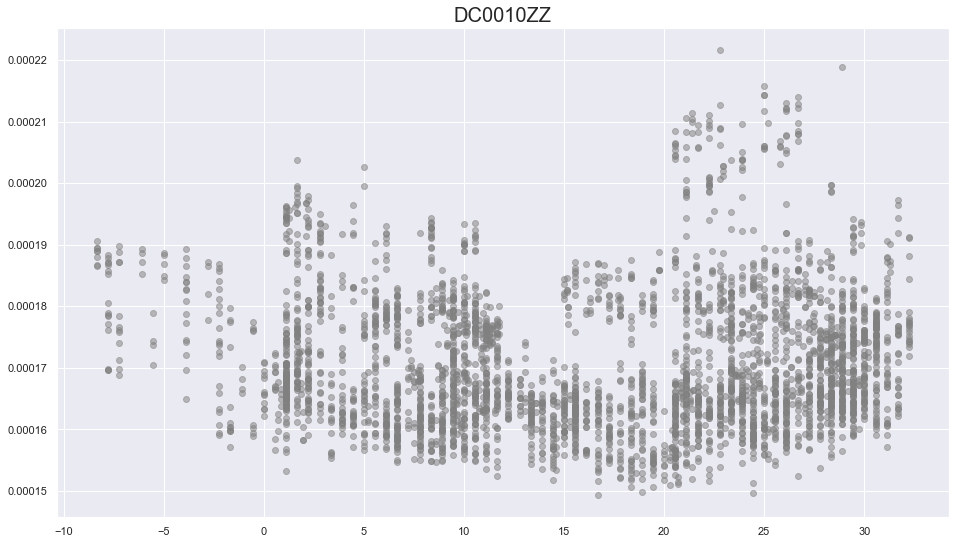

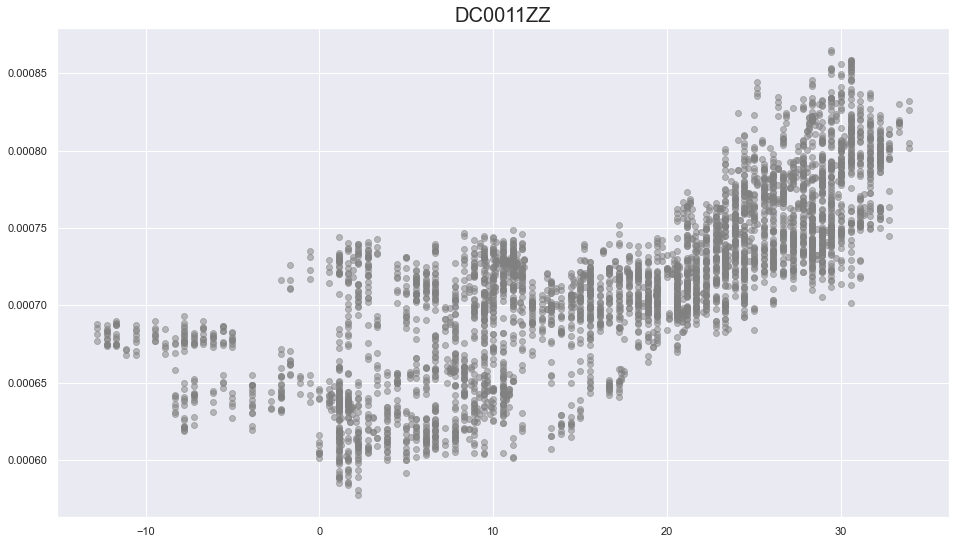

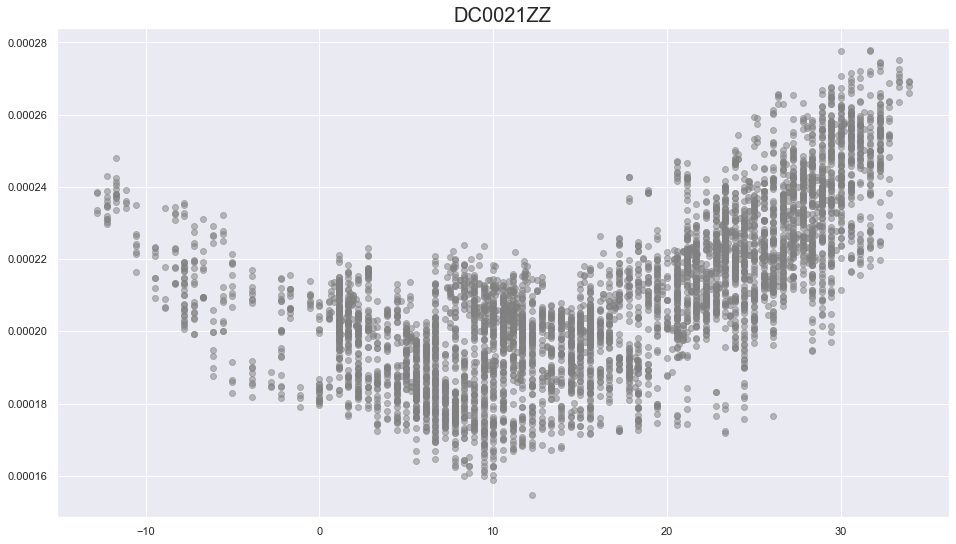

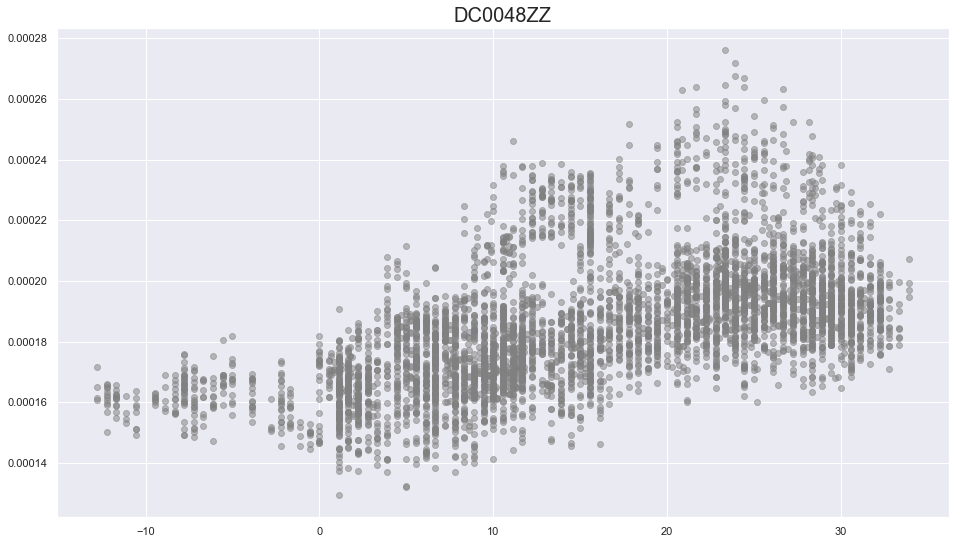

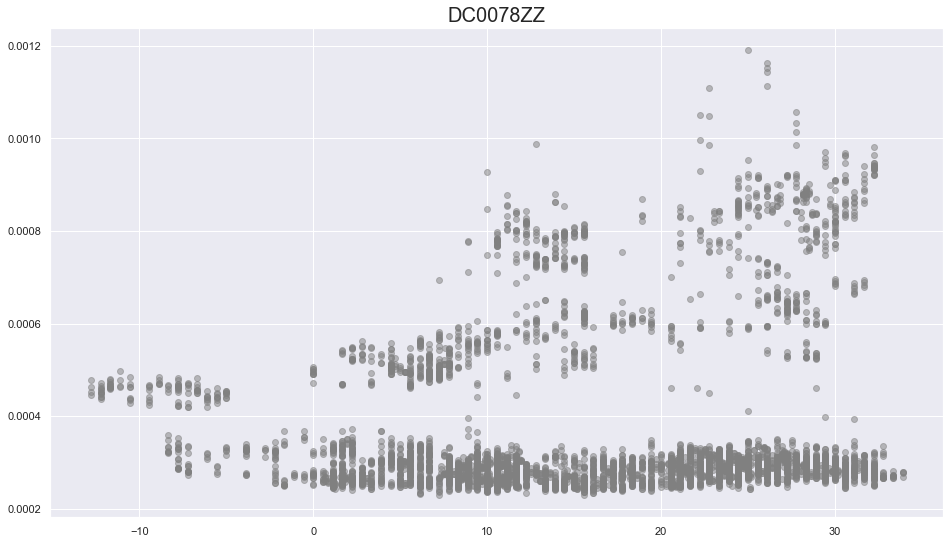

...

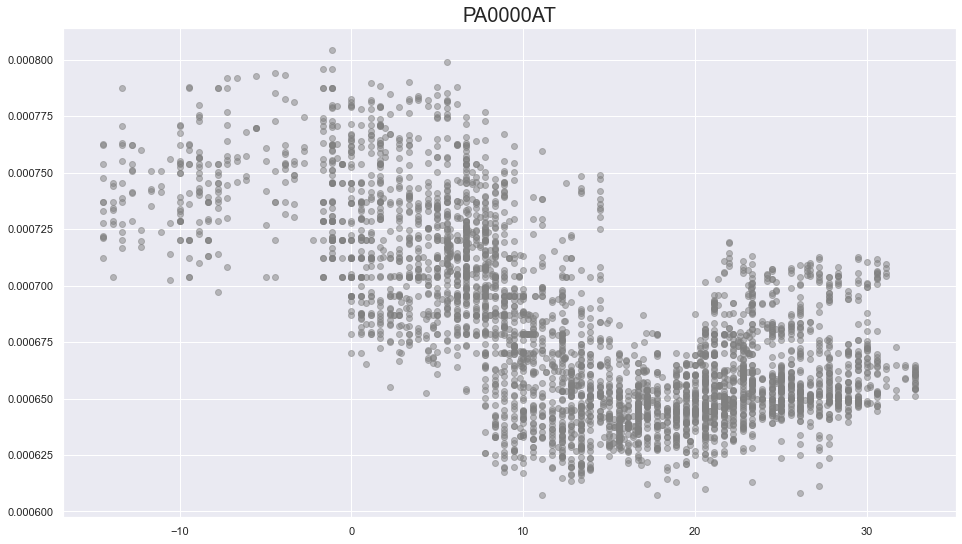

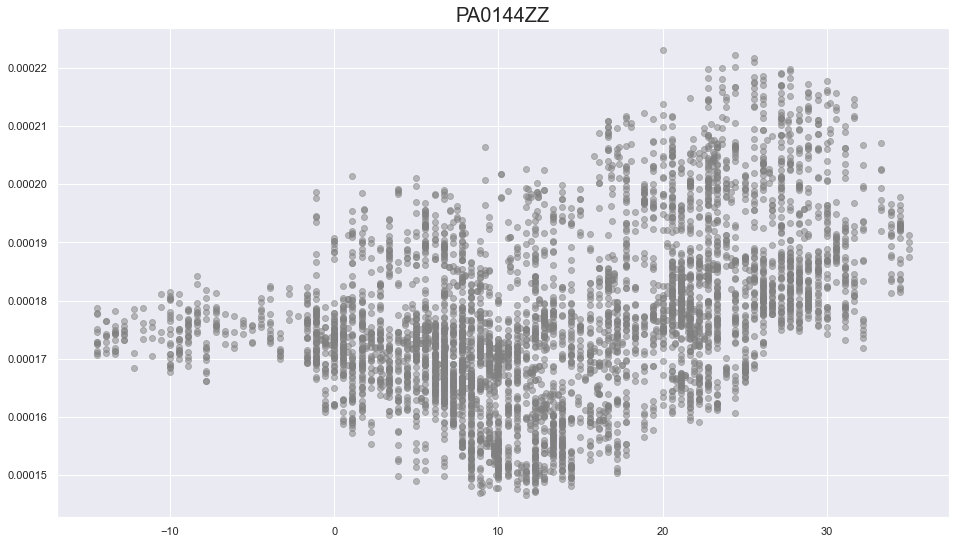

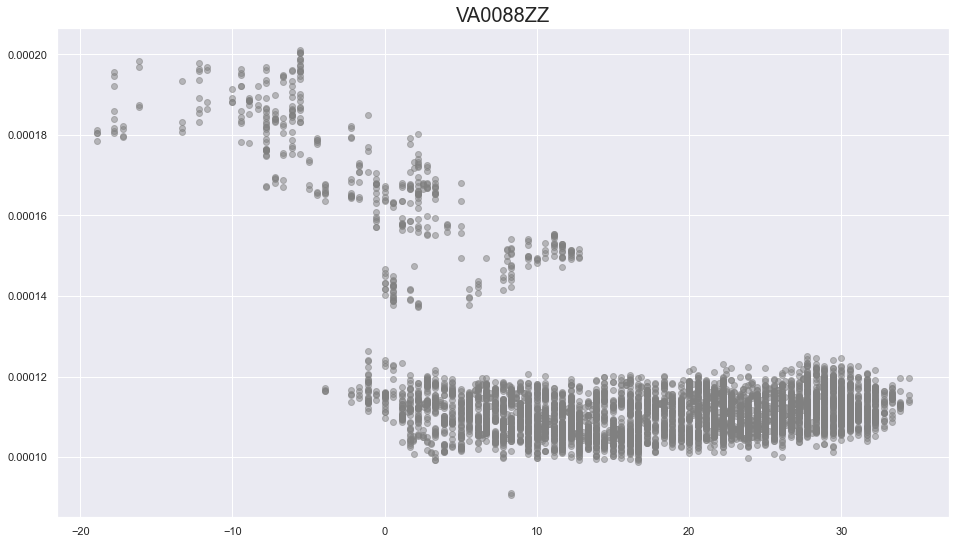

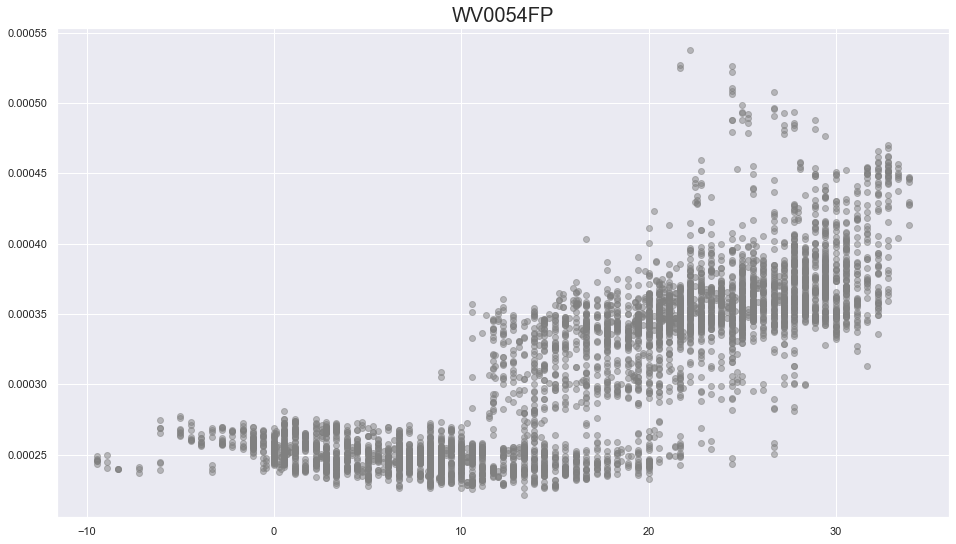

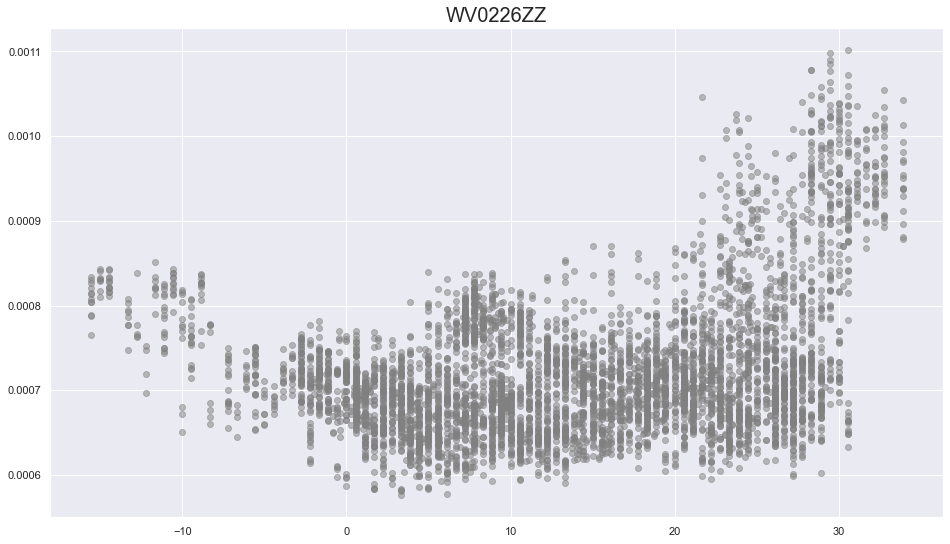

In [31]:
for i in buildings:
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[data.index.weekday >= 5].between_time('5:00', '19:00')
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
#     f = pwlf.PiecewiseLinFit(x, y)
#     res = f.fit(3)
    plt.subplots()
    plt.scatter((data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj], c='gray', alpha=0.5)
#     plt.scatter(x, f.predict(x))
    plt.title(f'{i}', fontsize=20)

In [17]:
segment = {'DC0010ZZ': 2,
           'DC0011ZZ': 2,
           'DC0021ZZ': 2,
           'DC0078ZZ': 2,
           'DC0313ZZ': 2,
           'DC0459AF': 2,
           'DC0463ZZ': 2,
           'DC0501BC': 2,
           'DC0505ZZ': 2,
           'MD0000HC': 2,
           'MD0205ZZ': 2,
           'MD0334ZZ': 2,
           'MD0778AG': 2,
           'MO0000AF': 2,
           'MO0106ZZ': 3,
           'MO0127ZZ': 2,
           'MO0134ZZ': 3,
           'NC0002AE': 2,
           'NJ0056ZZ': 2,
           'PA0000AT': 2,
           'PA0144ZZ': 2,
           'VA0088ZZ': 2,
           'WV0054FP': 2,
           'WV0226ZZ': 2}

In [20]:
list(segment.keys())

['DC0010ZZ',
 'DC0011ZZ',
 'DC0021ZZ',
 'DC0078ZZ',
 'DC0313ZZ',
 'DC0459AF',
 'DC0463ZZ',
 'DC0501BC',
 'DC0505ZZ',
 'MD0000HC',
 'MD0205ZZ',
 'MD0334ZZ',
 'MD0778AG',
 'MO0000AF',
 'MO0106ZZ',
 'MO0127ZZ',
 'MO0134ZZ',
 'NC0002AE',
 'NJ0056ZZ',
 'PA0000AT',
 'PA0144ZZ',
 'VA0088ZZ',
 'WV0054FP',
 'WV0226ZZ']

<ipython-input-21-faf3a16d5d75>:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.subplots()


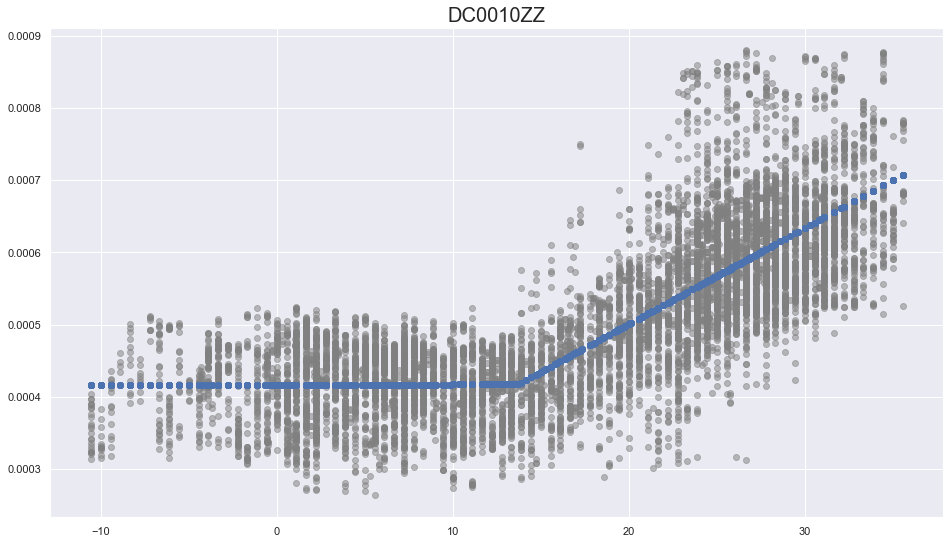

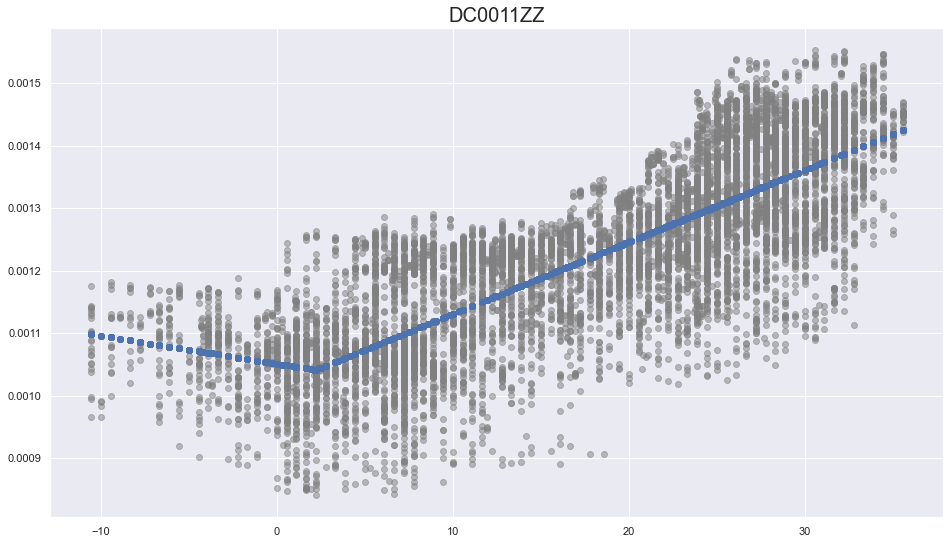

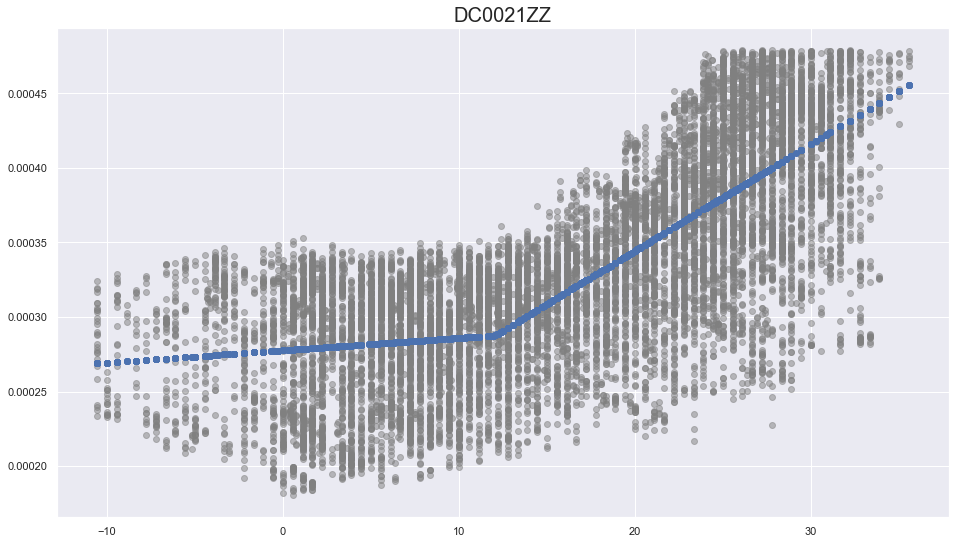

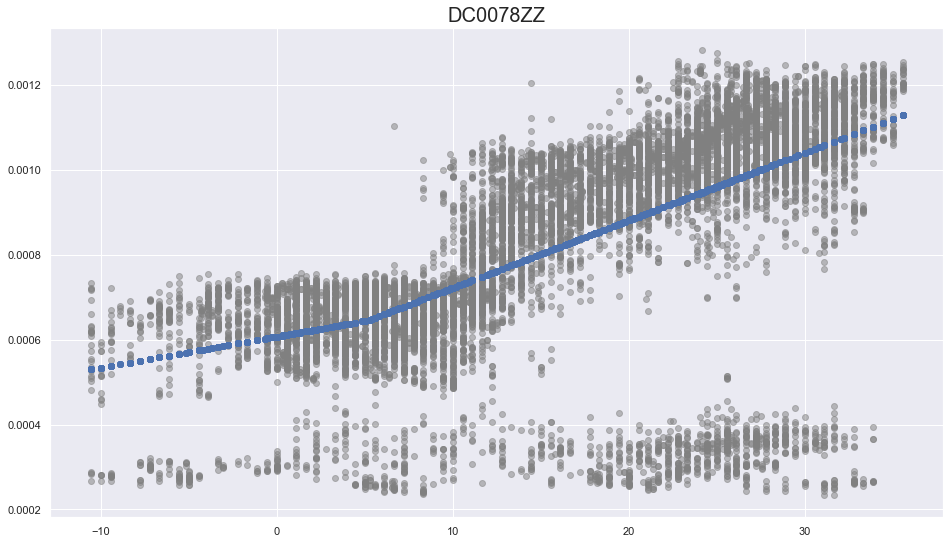

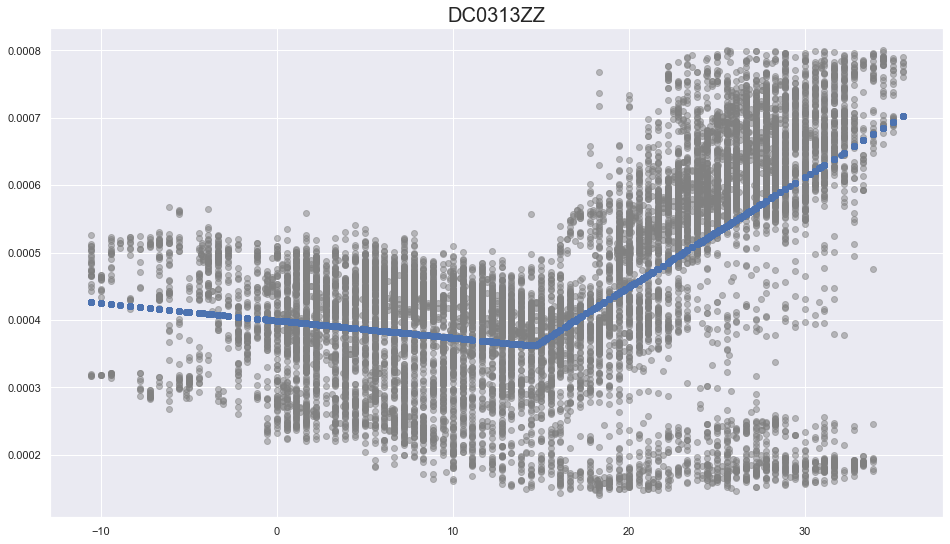

...

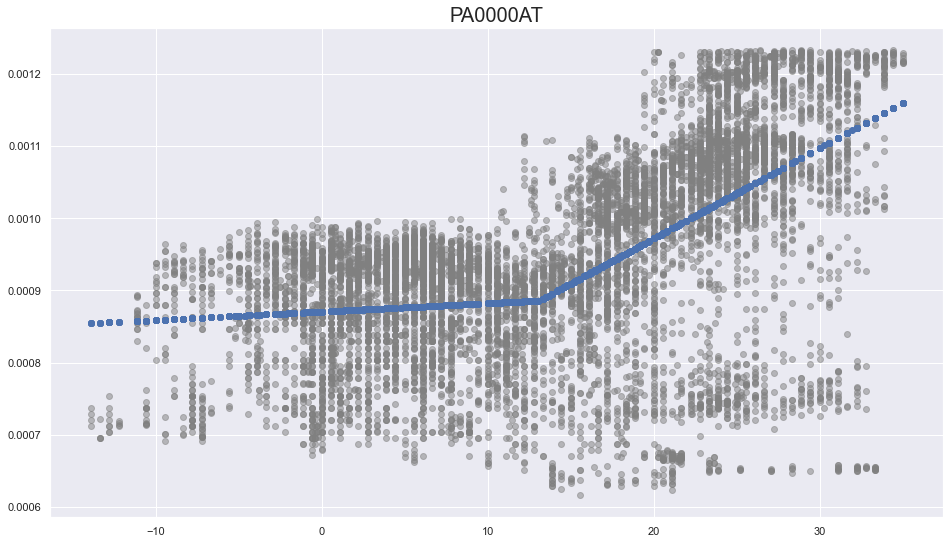

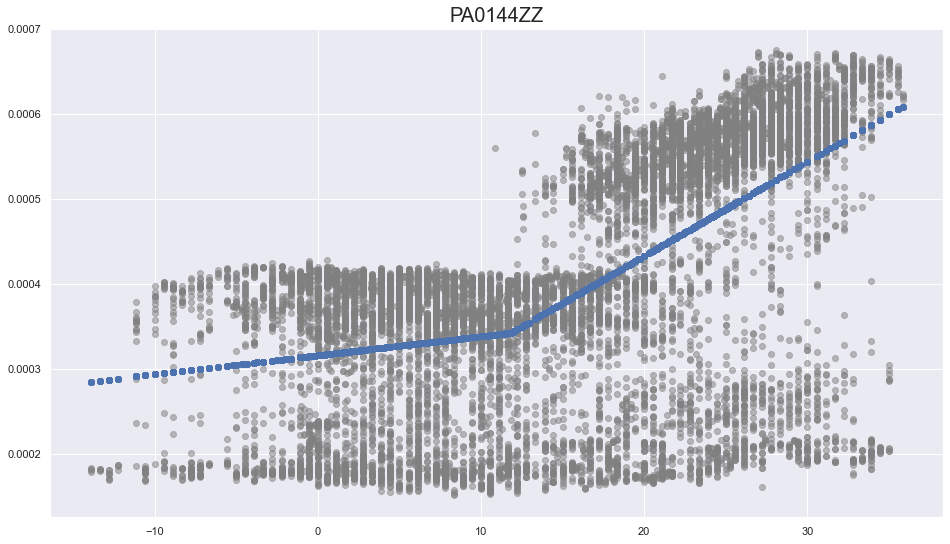

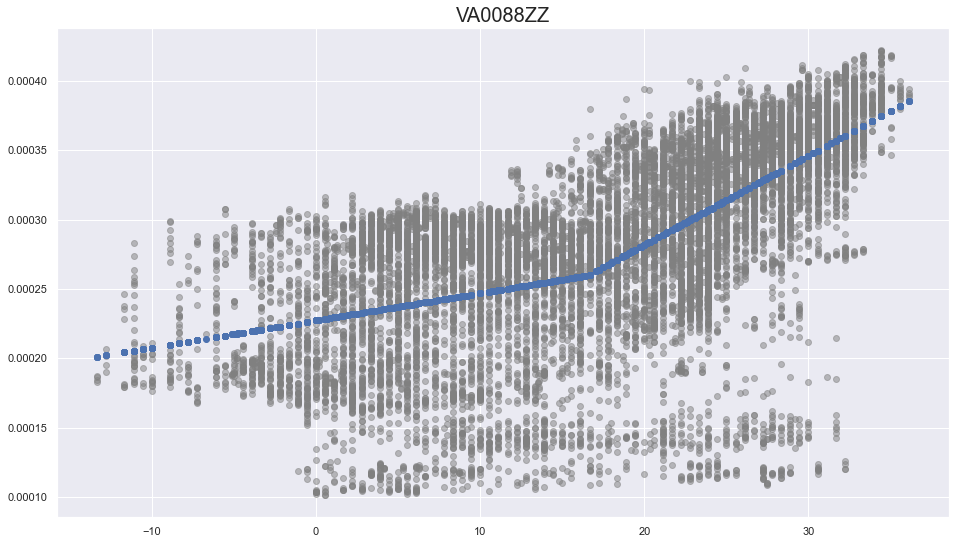

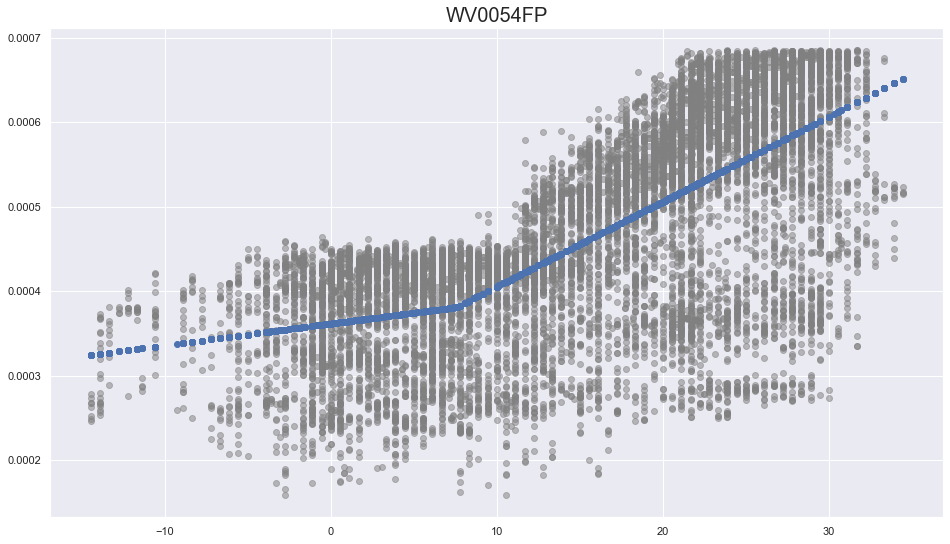

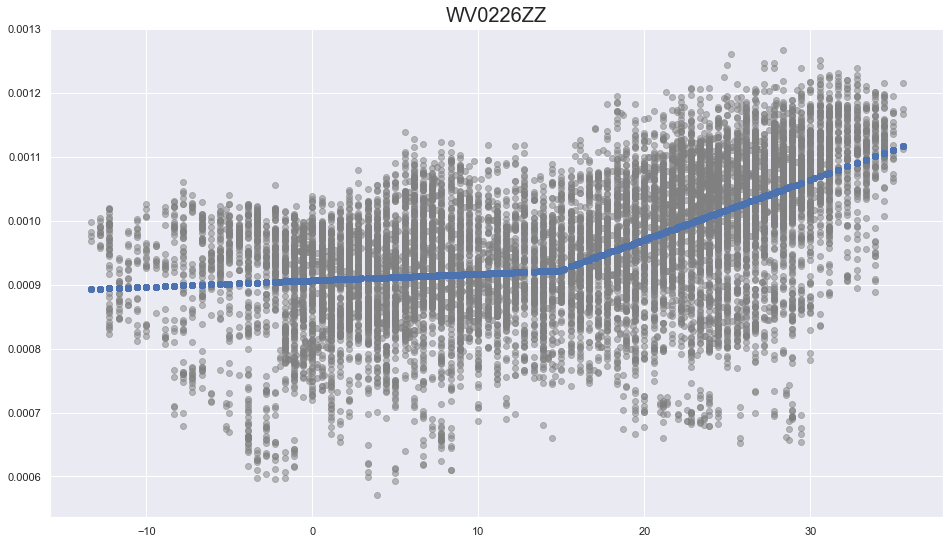

In [21]:
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[data.index.weekday < 5].between_time('5:00', '19:00')
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    plt.subplots()
    plt.scatter((data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj], c='gray', alpha=0.5)
    plt.scatter(x, f.predict(x))
    plt.title(f'{i}', fontsize=20)

## Breakpoints after clean the data

In [31]:
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[data.index.weekday < 5].between_time('5:00', '19:00')
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e']
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    _, *breakpoints, _ = f.fit_breaks
    print(i, breakpoints)
#     if segment[i] == 2:
#         breakpoints = result['estimates']['breakpoint1']['estimate']
#         print(f'{i} breakpoint:{breakpoints}')
#     else:
#         breakpoints = result['estimates']['breakpoint1']['estimate'], result['estimates']['breakpoint2']['estimate']
#         print(f'{i} breakpoint:{breakpoints}')

/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0010ZZ [13.679076505420616]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0011ZZ [1.903370431780909]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0021ZZ [12.053609352677611]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0078ZZ [5.000000527323764]
DC0313ZZ [14.33106445996147]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0459AF [16.6264871085409]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0463ZZ [18.005972044678206]
DC0501BC [14.2910389728626]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0505ZZ [14.439999999953832]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MD0000HC [12.7799109807474]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MD0205ZZ [21.390002070252663]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MD0334ZZ [12.465574513679321]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MD0778AG [15.51916846425206]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MO0000AF [11.669999840671553]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MO0106ZZ [13.33001216173894, 23.844507483444836]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MO0127ZZ [11.171410107137193]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MO0134ZZ [-5.559999997234526, 19.36719755917712]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


NC0002AE [11.109999989289408]
NJ0056ZZ [24.047630062886093]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


PA0000AT [12.891174677600077]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


PA0144ZZ [11.602306167289917]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


VA0088ZZ [16.16117248055484]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


WV0054FP [7.762185730106803]
WV0226ZZ [14.676146099318565]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


Text(0.5, 1.0, 'MD0778AG')

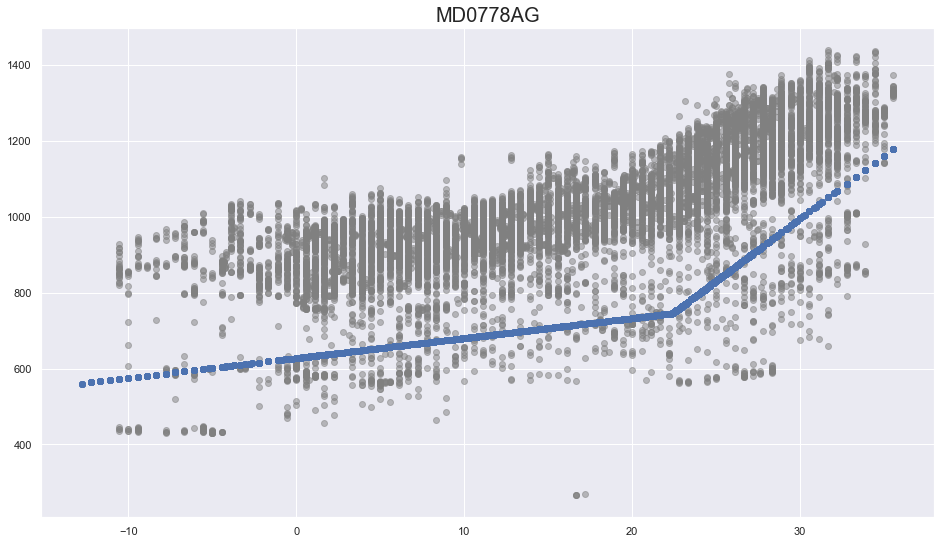

In [43]:
data = pd.DataFrame()
data['w'] = w['MD0778AG']
data['e'] = e['MD0778AG']
data = data.dropna()
x, y = (data)['w'], (data)['e']
data = data[data.index.weekday < 5].between_time('5:00', '19:00')
f = pwlf.PiecewiseLinFit(x, y)
res = f.fit(2)
plt.subplots()
plt.scatter((data)['w'], (data)['e'], c='gray', alpha=0.5)
plt.scatter(x, f.predict(x))
plt.title(f'MD0778AG', fontsize=20)

/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


Text(0.5, 1.0, 'DC0011ZZ')

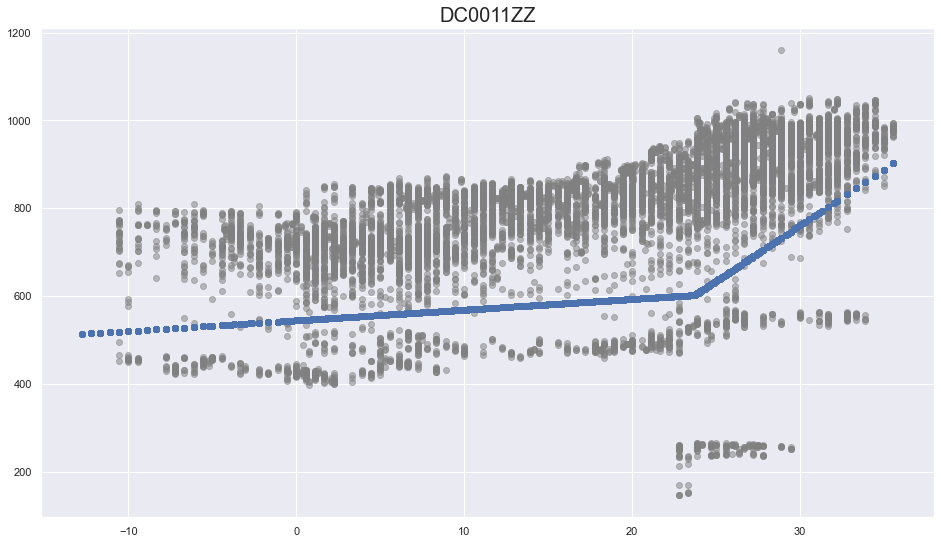

In [36]:
data = pd.DataFrame()
data['w'] = w['DC0011ZZ']
data['e'] = e['DC0011ZZ']
data = data.dropna()
x, y = (data)['w'], (data)['e']
data = data[data.index.weekday < 5].between_time('5:00', '19:00')
f = pwlf.PiecewiseLinFit(x, y)
res = f.fit(2)
plt.subplots()
plt.scatter((data)['w'], (data)['e'], c='gray', alpha=0.5)
plt.scatter(x, f.predict(x))
plt.title(f'DC0011ZZ', fontsize=20)

Text(0.5, 1.0, 'DC0011ZZ')

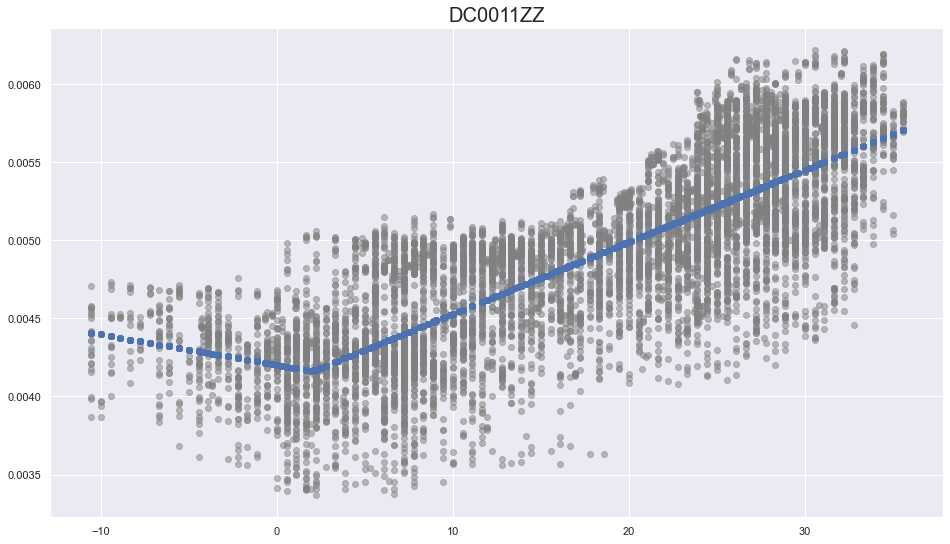

In [40]:
data = pd.DataFrame()
data['w'] = w['DC0011ZZ']
data['e'] = e['DC0011ZZ']
data = data.dropna()
data = data[data.index.weekday < 5].between_time('5:00', '19:00')
    
clustering = DBSCAN(eps=5, min_samples=8).fit(data)
res = np.unique(clustering.labels_, return_counts=True)
maj = res[0][np.argmax(res[1])]
    
data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
f = pwlf.PiecewiseLinFit(x, y)
res = f.fit(2)
plt.subplots()
plt.scatter((data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj], c='gray', alpha=0.5)
plt.scatter(x, f.predict(x))
plt.title('DC0011ZZ', fontsize=20)

Text(0.5, 1.0, 'DC0011ZZ')

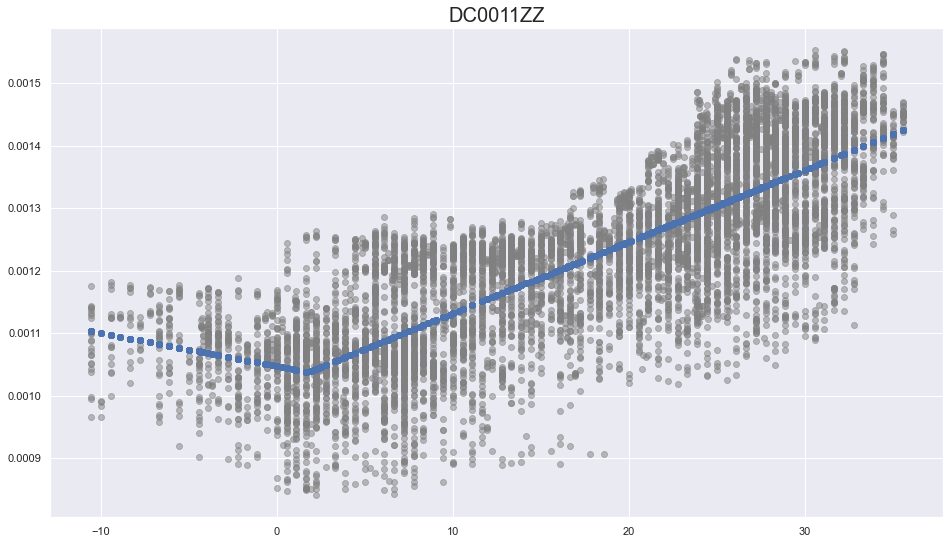

In [42]:
data = pd.DataFrame()
data['w'] = w['DC0011ZZ']
data['e'] = e['DC0011ZZ']
data = data.dropna()
data = data[data.index.weekday < 5].between_time('5:00', '19:00')
    
clustering = DBSCAN(eps=5, min_samples=8).fit(data)
res = np.unique(clustering.labels_, return_counts=True)
maj = res[0][np.argmax(res[1])]
    
data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == 'DC0011ZZ'].values[0])
    
x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
f = pwlf.PiecewiseLinFit(x, y)
res = f.fit(segment['DC0011ZZ'])
plt.subplots()
plt.scatter((data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj], c='gray', alpha=0.5)
plt.scatter(x, f.predict(x))
plt.title('DC0011ZZ', fontsize=20)

## Breakpoints without cleaning the data

In [32]:
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[data.index.weekday < 5].between_time('5:00', '19:00')

    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'], (data)['e']
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    _, *breakpoints, _ = f.fit_breaks
    print(i, breakpoints)

DC0010ZZ [15.408647205040216]
DC0011ZZ [23.548323425363876]
DC0021ZZ [11.927407831570735]
DC0078ZZ [5.243480373626552]
DC0313ZZ [14.554250836623087]
DC0459AF [10.956161752830218]
DC0463ZZ [18.5333214374963]
DC0501BC [14.869905254273444]
DC0505ZZ [13.913161926980159]
MD0000HC [31.42646973778342]
MD0205ZZ [21.28767818925466]
MD0334ZZ [14.479277144225415]
MD0778AG [18.295239038335197]
MO0000AF [11.209546827587122]
MO0106ZZ [14.160323464259005, 23.52063399407921]
MO0127ZZ [34.50495201657098]
MO0134ZZ [-5.896103323283169, 18.20653202316941]
NC0002AE [11.311887219852931]
NJ0056ZZ [22.914854425166993]
PA0000AT [10.435253207108692]
PA0144ZZ [10.867560905980422]
VA0088ZZ [16.640564226254817]
WV0054FP [7.2872297044437335]
WV0226ZZ [14.537470837829357]


<ipython-input-45-e1e94d4360ae>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.subplots()


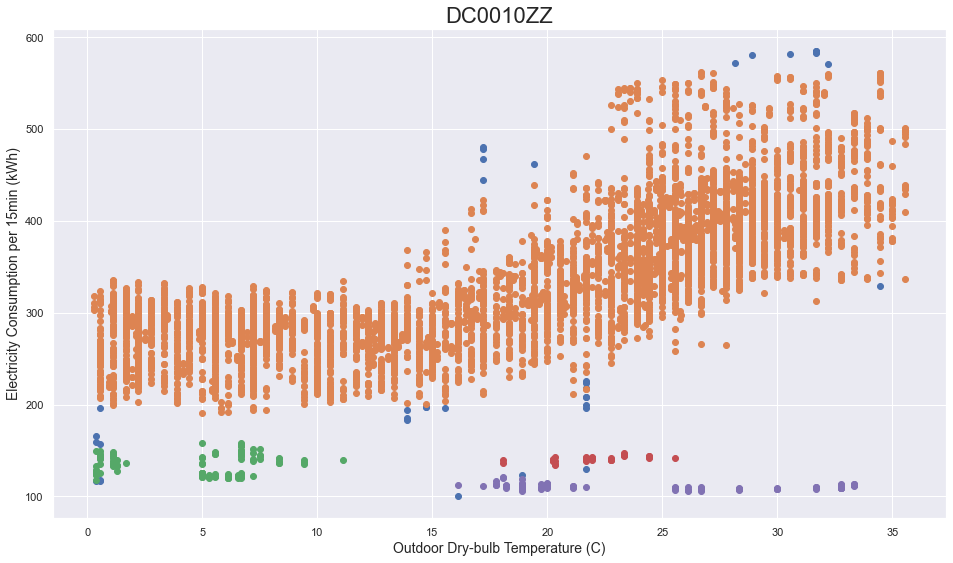

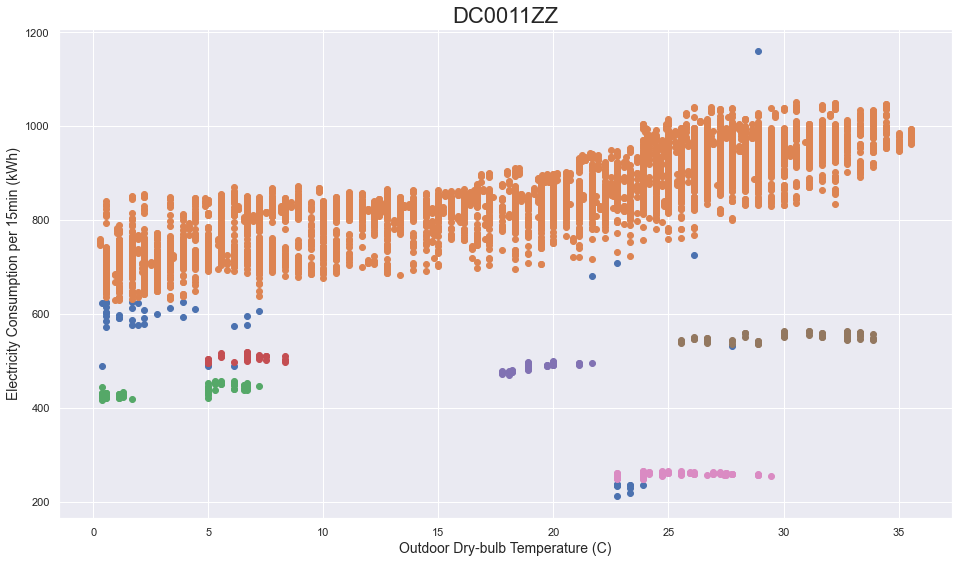

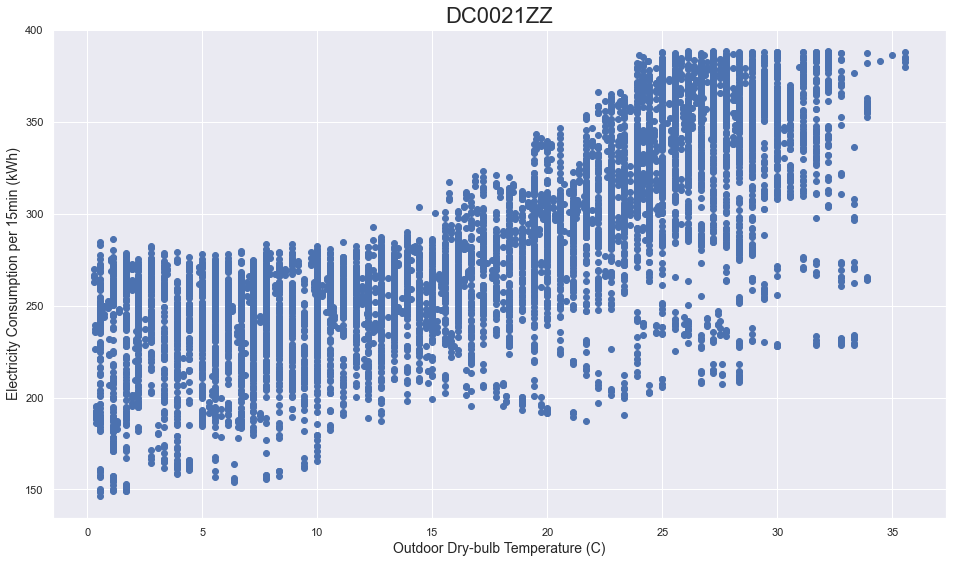

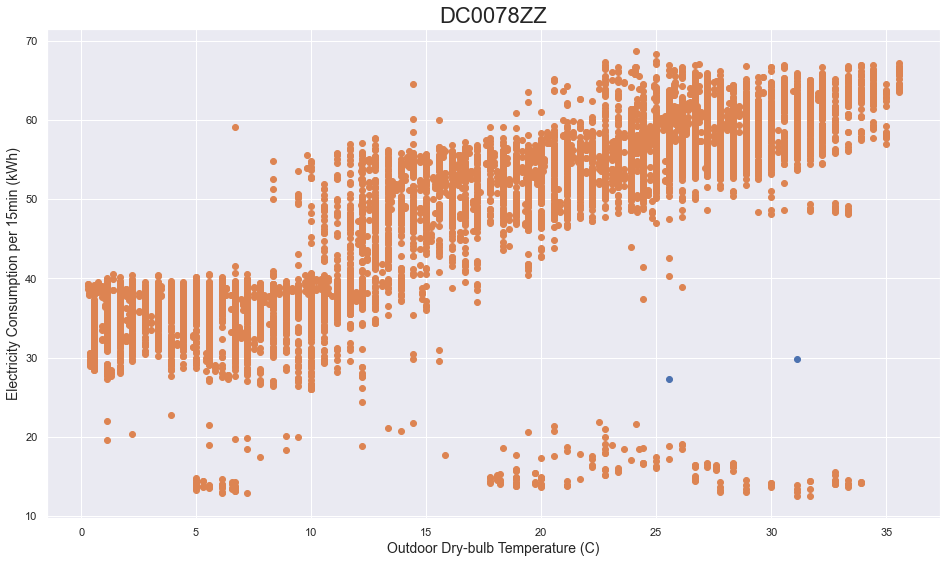

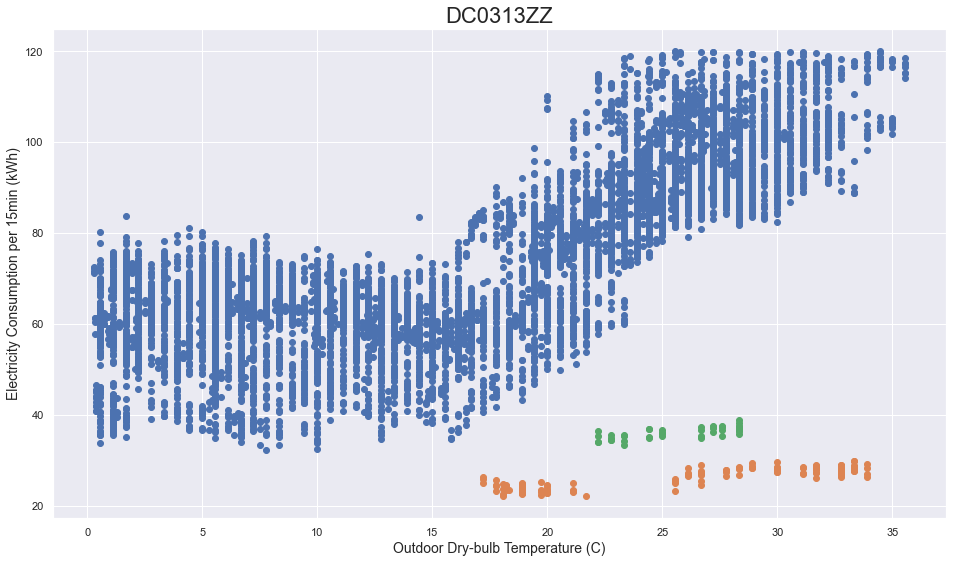

...

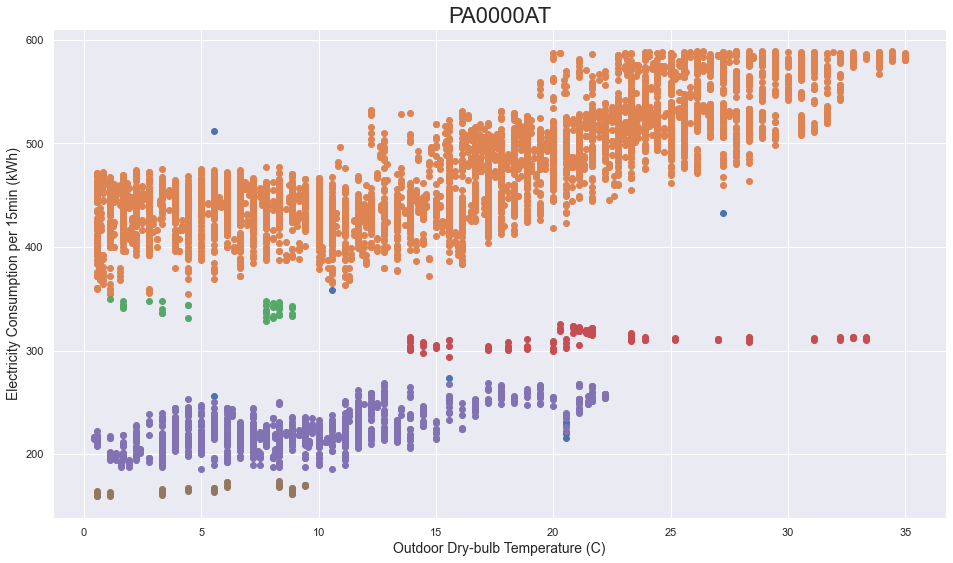

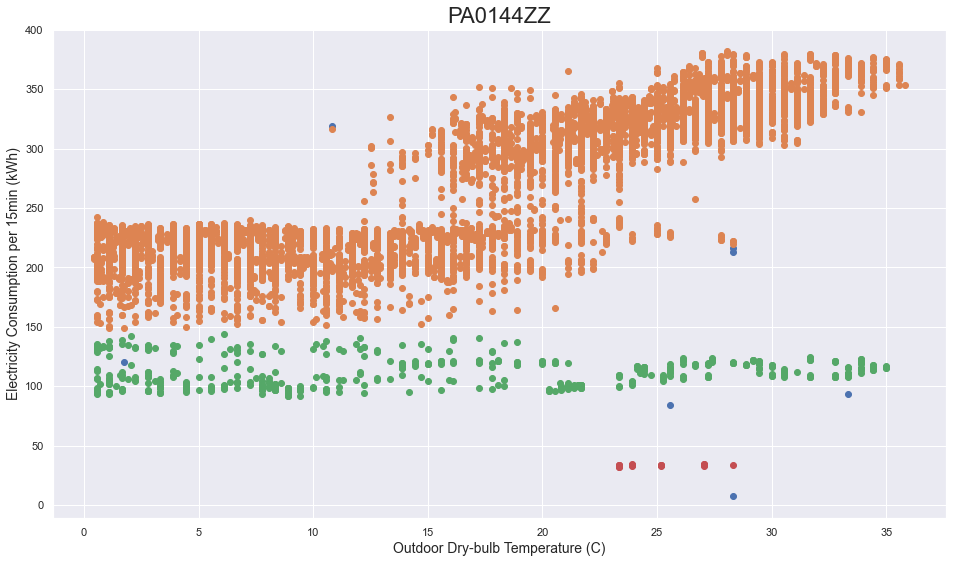

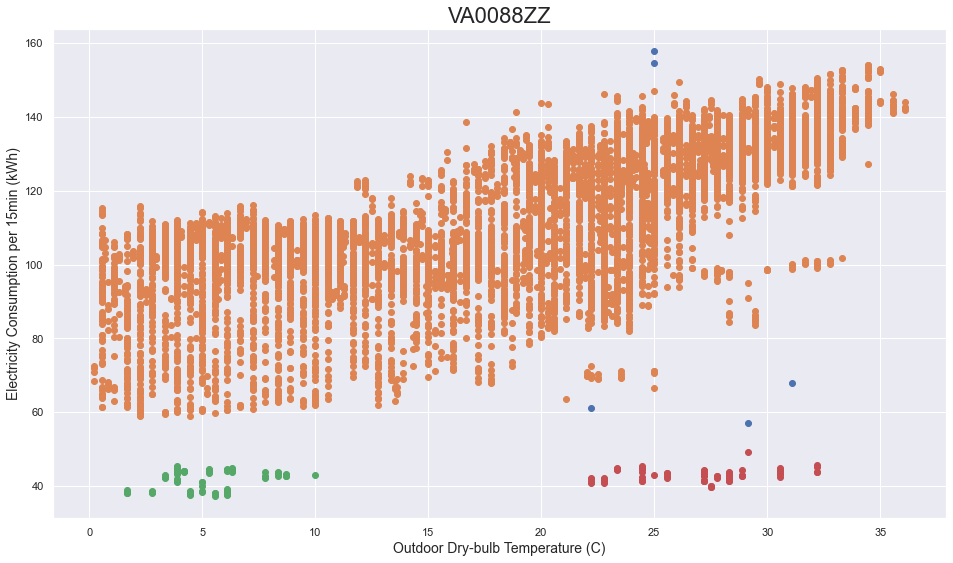

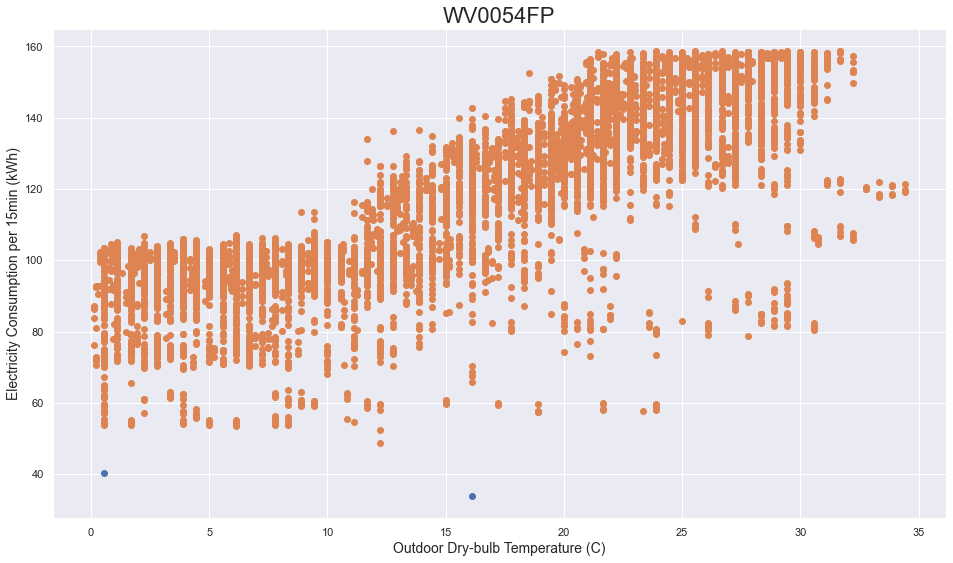

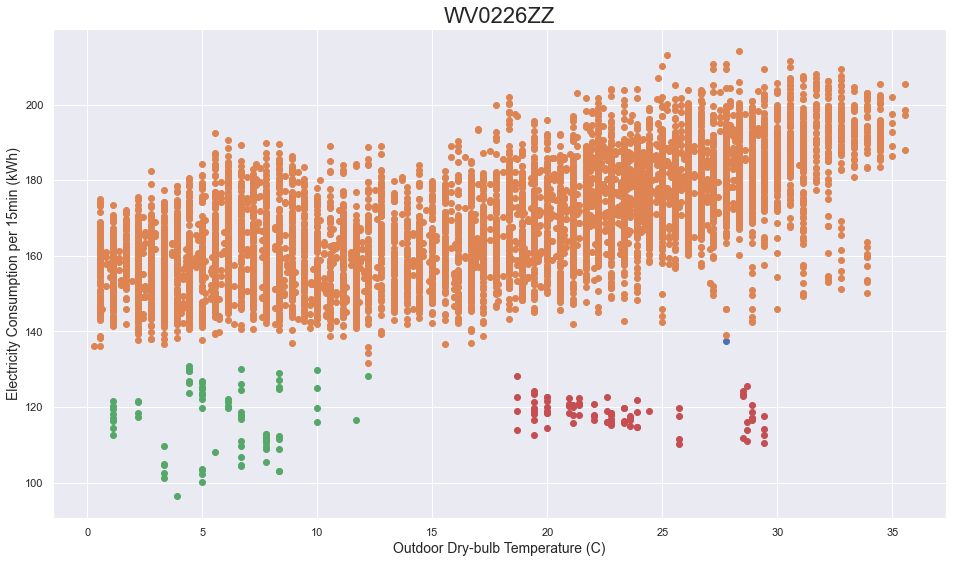

In [45]:
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data[data > 0 ]
    data = data.dropna()
    data = data[data.index.weekday < 5].between_time('6:00', '16:00')
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    plt.subplots()
    for j in np.unique(clustering.labels_):
        plt.scatter((data)['w'][clustering.labels_==j],(data)['e'][clustering.labels_==j])
    plt.title(f'{i}', size=22)
    plt.ylabel('Electricity Consumption per 15min (kWh)', size=14)
    plt.xlabel('Outdoor Dry-bulb Temperature (C)', size=14)

In [66]:
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[data.index.weekday < 5].between_time('6:00', '16:00')
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    x_ = np.linspace(-20, 35, 100)
#     plt.plot(x_, f.predict(x_), label=i, alpha=0.7, lw=8)
    data_agg[i] = f.predict(x_)

In [67]:
fig = px.line(data_agg, x=data_agg['Temperature'], y=data_agg.columns[1:])
fig.update_xaxes(title_text='Temperature C')
fig.update_yaxes(title_text='Electiricy Consumption per sf kWh 15min/sf')

In [68]:
fig.write_html("lean_4a.html")

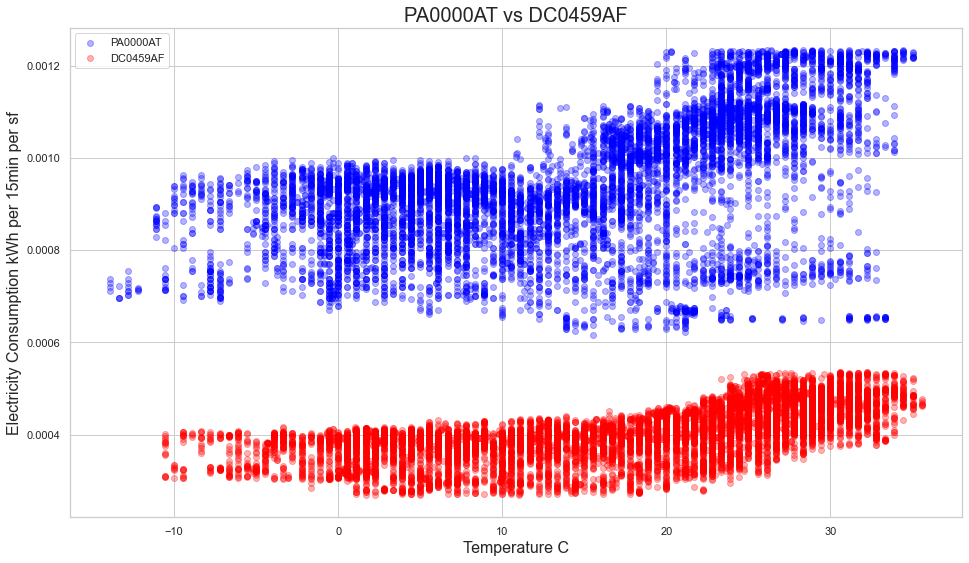

In [70]:
for i in ['PA0000AT', 'DC0459AF']:
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[data.index.weekday < 5].between_time('5:00', '19:00')
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
#     f = pwlf.PiecewiseLinFit(x, y)
#     res = f.fit(segment[i])
    if i == 'PA0000AT':
        plt.scatter((data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj], c='blue', alpha=0.3, label='PA0000AT')
    else:
        plt.scatter((data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj], c='red', alpha=0.3, label='DC0459AF')
    plt.legend()
#     plt.scatter(x, f.predict(x))
    plt.ylabel('Electricity Consumption kWh per 15min per sf', fontsize=16)
    plt.xlabel('Temperature C', fontsize=16)
    plt.title('PA0000AT vs DC0459AF', fontsize=20)

Text(0.5, 1.0, 'Yearly Raw Data Comparison')

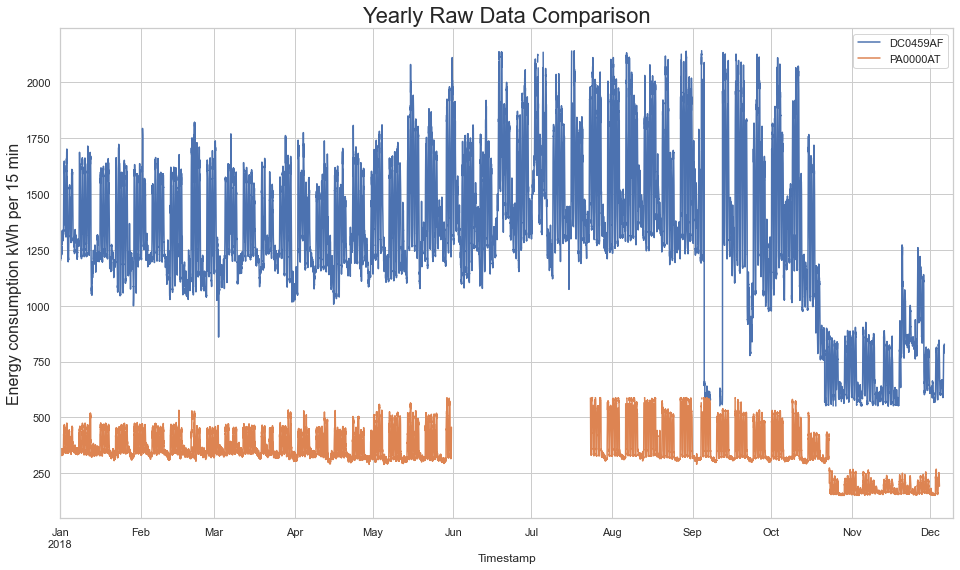

In [75]:
e['DC0459AF'].plot()
e['PA0000AT'].plot()
plt.ylabel('Energy consumption kWh per 15 min', fontsize=16)
plt.legend()
plt.title('Yearly Raw Data Comparison', fontsize=22)

In [72]:
comp = pd.DataFrame()

In [73]:
comp['DC0459AF'] = e['DC0459AF']/(building_info['floor area (sf)'][building_info['code'] == 'DC0459AF'].values[0])
comp['PA0000AT'] = e['PA0000AT']/(building_info['floor area (sf)'][building_info['code'] == 'DC0010ZZ'].values[0])

Text(0.5, 1.0, 'Yearly Normalized Data Comparison')

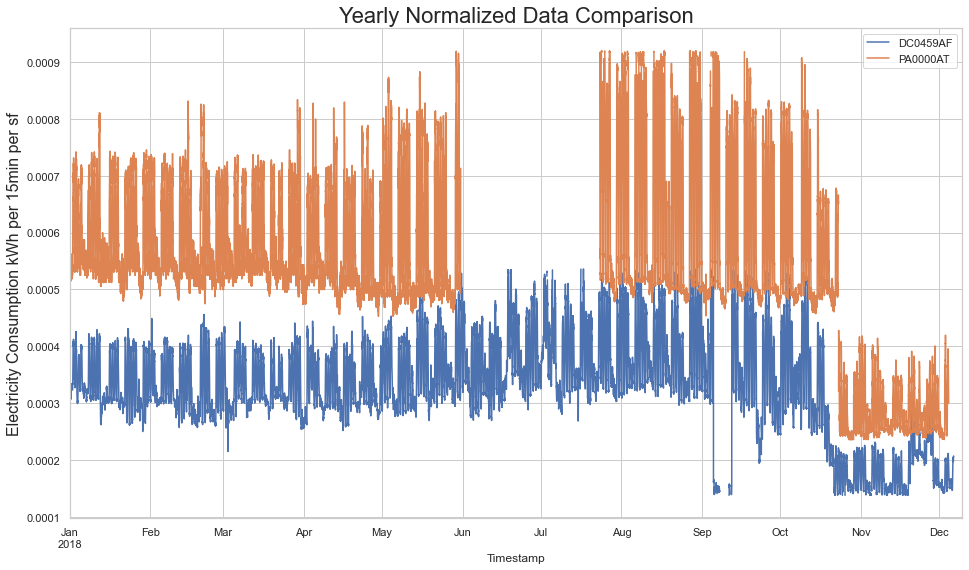

In [77]:
comp.plot()
plt.ylabel('Electricity Consumption kWh per 15min per sf', fontsize=16)
plt.title('Yearly Normalized Data Comparison', fontsize=22)

In [79]:
(w['PA0000AT'] == w['DC0459AF']).sum()

2456

In [80]:
data = pd.DataFrame()
data['w'] = w['DC0459AF']
data['e'] = e['DC0459AF']
data = data.dropna()
data = data[data.index.weekday < 5].between_time('5:00', '19:00')
    
clustering = DBSCAN(eps=5, min_samples=8).fit(data)
res = np.unique(clustering.labels_, return_counts=True)
maj = res[0][np.argmax(res[1])]
    
data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == 'DC0459AF'].values[0])
    
x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
f = pwlf.PiecewiseLinFit(x, y)
res = f.fit(segment['DC0459AF'])

Text(0.5, 1.0, 'PA0000AT(original) vs PA0000AT(learned from DC0459AF)')

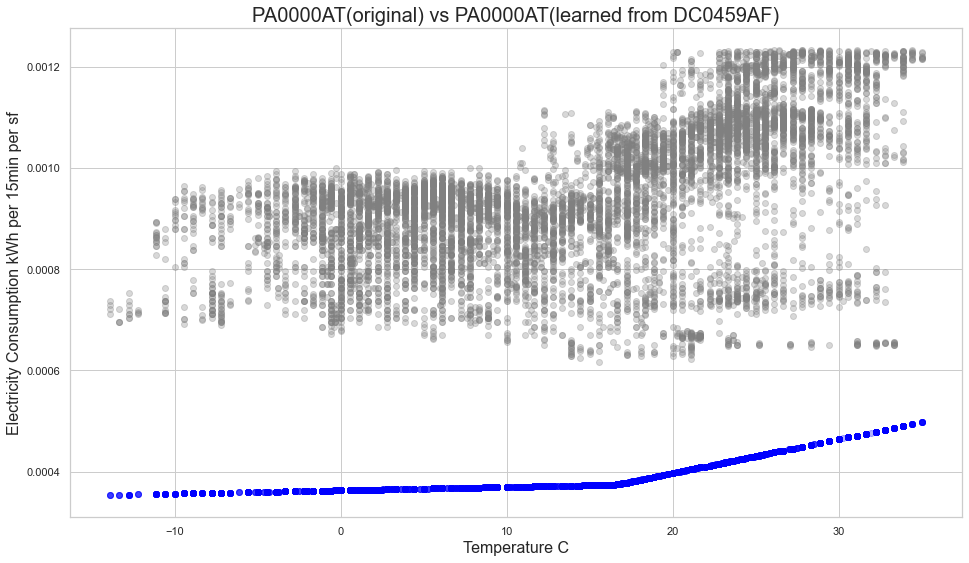

In [82]:
data = pd.DataFrame()
data['w'] = w['PA0000AT']
data['e'] = e['PA0000AT']
data = data.dropna()
data = data[data.index.weekday < 5].between_time('5:00', '19:00')
    
clustering = DBSCAN(eps=5, min_samples=8).fit(data)
res = np.unique(clustering.labels_, return_counts=True)
maj = res[0][np.argmax(res[1])]
    
data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == 'PA0000AT'].values[0])
plt.scatter((data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj], c='grey', alpha=0.3, label='PA0000AT original')
plt.scatter((data)['w'][clustering.labels_== maj], f.predict((data)['w'][clustering.labels_== maj]), c='blue', alpha=0.3, label='PA0000AT after_learn')
plt.ylabel('Electricity Consumption kWh per 15min per sf', fontsize=16)
plt.xlabel('Temperature C', fontsize=16)
plt.title('PA0000AT(original) vs PA0000AT(learned from DC0459AF)', fontsize=20)

In [85]:
f.predict((data)['w'][clustering.labels_== maj]).sum() * (building_info['floor area (sf)'][building_info['code'] == 'PA0000AT'].values[0])

1785530.2734300531

In [86]:
e['PA0000AT'].sum()

9453512.874

In [87]:
data = pd.DataFrame()
data['w'] = w['PA0000AT']
data['e'] = e['PA0000AT']
data = data.dropna()
data = data[data.index.weekday < 5].between_time('5:00', '19:00')
    
clustering = DBSCAN(eps=5, min_samples=8).fit(data)
res = np.unique(clustering.labels_, return_counts=True)
maj = res[0][np.argmax(res[1])]
    
data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == 'PA0000AT'].values[0])
    
x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
f_ = pwlf.PiecewiseLinFit(x, y)
res = f_.fit(segment['PA0000AT'])

In [88]:
f_.predict((data)['w'][clustering.labels_== maj]).sum() * (building_info['floor area (sf)'][building_info['code'] == 'PA0000AT'].values[0])

4297144.894999997

In [96]:
data = {'x' : ['PA0000AT original','PA0000AT learned from DC0459AF'],
        'y' : [4297144.89, 1785530.27]}

AttributeError: 'AxesSubplot' object has no attribute 'bar_label'

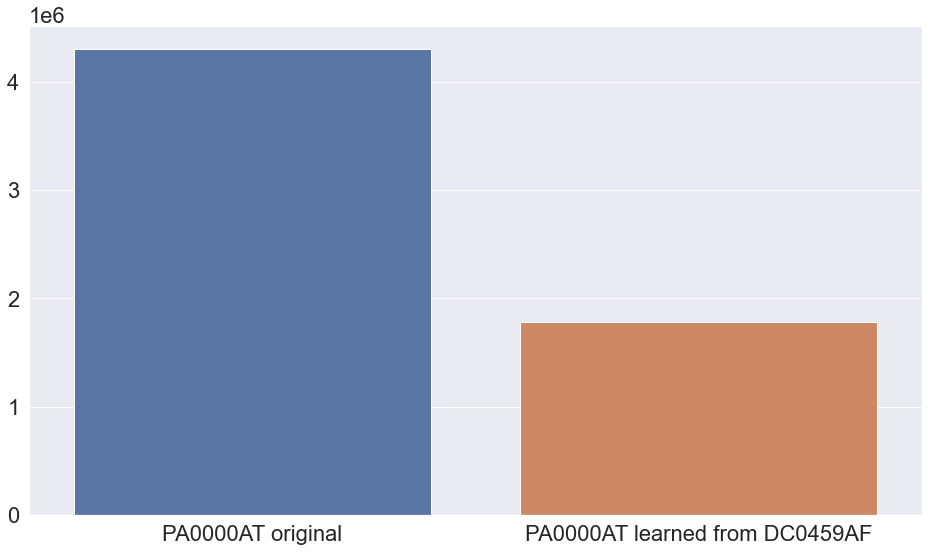

In [116]:
ax = sns.barplot(x = 'x',
            y = 'y',
            data = data)
ax.bar_label(ax.containers[0])

In [117]:
(4297144.89 - 1785530.27)/4297144.89

0.584484508736218